<a href="https://colab.research.google.com/github/Jessakins/face-mask-classifier/blob/main/Face_Mask_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D, Dropout
from tensorflow.keras.optimizers import Adam
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from google.colab import files

In [ ]:
uploaded = files.upload()

Saving Dataset.zip to Dataset.zip


In [ ]:
!unzip Dataset.zip

Archive:  Dataset.zip
  inflating: Dataset/With Mask/0-with-mask.jpg  
  inflating: Dataset/With Mask/1-respirator-mask.jpg  
  inflating: Dataset/With Mask/10-with-mask.jpg  
  inflating: Dataset/With Mask/100-with-mask.jpg  
  inflating: Dataset/With Mask/101-with-mask.jpg  
  inflating: Dataset/With Mask/103-with-mask.jpg  
  inflating: Dataset/With Mask/104-with-mask.jpg  
  inflating: Dataset/With Mask/105-with-mask.jpg  
  inflating: Dataset/With Mask/106.jpg  
  inflating: Dataset/With Mask/107-with-mask.jpg  
  inflating: Dataset/With Mask/108-with-mask.jpg  
  inflating: Dataset/With Mask/109-with-mask.jpg  
  inflating: Dataset/With Mask/10Pcs-pack-Disposable-Non-Woven-Black-Face-Mask-Earloop-Anti.jpg  
  inflating: Dataset/With Mask/112-with-mask.jpg  
  inflating: Dataset/With Mask/113-with-mask.jpg  
  inflating: Dataset/With Mask/115-with-mask.jpg  
  inflating: Dataset/With Mask/116-with-mask.jpg  
  inflating: Dataset/With Mask/117-with-mask.jpg  
  inflating: Dataset/W

In [ ]:
!rm Dataset.zip

In [ ]:
batch_size = 8
epochs = 30

In [ ]:
directory = 'Dataset'

img_datagen = ImageDataGenerator(validation_split=0.2, rescale = 1./255, rotation_range=40,
                                 width_shift_range=0.2, height_shift_range=0.2, zoom_range=0.2,
                                 horizontal_flip=True, fill_mode='nearest')

train_generator = img_datagen.flow_from_directory(directory, target_size = (70, 70), batch_size = batch_size,
                                                  color_mode = "rgb", class_mode = 'binary', shuffle = True,
                                                  seed = 42, subset = 'training')

validation_generator = img_datagen.flow_from_directory(directory, target_size = (70, 70),batch_size = batch_size,
                                                  color_mode = "rgb", class_mode = 'binary', shuffle = True,
                                                  seed = 42, subset = 'validation')

Found 160 images belonging to 2 classes.
Found 40 images belonging to 2 classes.


In [ ]:
imgs, labels = next(train_generator)

In [ ]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, batch_size, figsize=(20, 20))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
      ax.imshow(img)
      ax.axis('off')
    plt.tight_layout()
    plt.show()

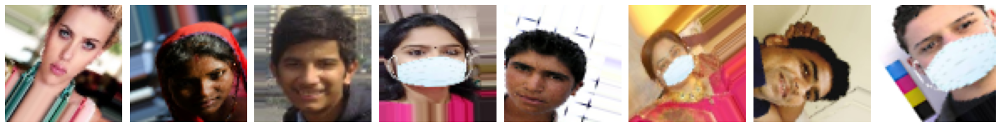

[1. 1. 1. 0. 1. 0. 1. 0.]


In [ ]:
plotImages(imgs);
print(labels);

In [ ]:
model = Sequential([Conv2D(filters= 32, kernel_size= (3,3), activation= 'relu', padding= 'same', 
                           input_shape= (70,70,3)),
                    MaxPool2D(pool_size= (2,2), strides= 2),
                    Conv2D(filters= 32, kernel_size= (3,3), activation= 'relu', padding= 'same'),
                    MaxPool2D(pool_size= (2,2), strides= 2),
                    Conv2D(filters= 64, kernel_size= (3,3), activation= 'relu', padding= 'same'),
                    MaxPool2D(pool_size= (2,2), strides= 2),
                    Flatten(),
                    Dense(units=64, activation= 'relu'),
                    Dense(units=1, activation= 'sigmoid'),
                    
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 70, 70, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 35, 35, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 35, 35, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 17, 17, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 17, 17, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 4096)              0

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(train_generator, epochs=epochs, validation_data=validation_generator, batch_size=batch_size)

Epoch 1/30
20/20 [==============================] - 3s 92ms/step - loss: 0.6900 - accuracy: 0.4938 - val_loss: 0.6763 - val_accuracy: 0.6750
Epoch 2/30
20/20 [==============================] - 2s 82ms/step - loss: 0.6813 - accuracy: 0.5688 - val_loss: 0.6774 - val_accuracy: 0.5000
Epoch 3/30
20/20 [==============================] - 2s 80ms/step - loss: 0.6676 - accuracy: 0.6313 - val_loss: 0.6551 - val_accuracy: 0.8250
Epoch 4/30
20/20 [==============================] - 2s 79ms/step - loss: 0.6619 - accuracy: 0.6687 - val_loss: 0.6555 - val_accuracy: 0.7500
Epoch 5/30
20/20 [==============================] - 2s 80ms/step - loss: 0.6423 - accuracy: 0.7688 - val_loss: 0.6333 - val_accuracy: 0.7500
Epoch 6/30
20/20 [==============================] - 2s 80ms/step - loss: 0.6100 - accuracy: 0.7688 - val_loss: 0.6258 - val_accuracy: 0.6000
Epoch 7/30
20/20 [==============================] - 2s 80ms/step - loss: 0.6199 - accuracy: 0.7063 - val_loss: 0.5992 - val_accuracy: 0.6500
Epoch 8/30
20

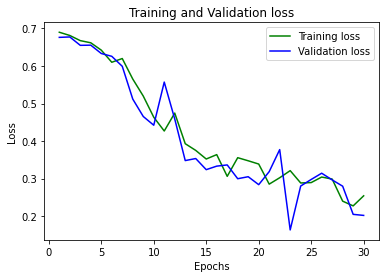

In [ ]:
loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochstoplot = range(1, epochs+1)
plt.plot(epochstoplot, loss_train, 'g', label='Training loss')
plt.plot(epochstoplot, loss_val, 'b', label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

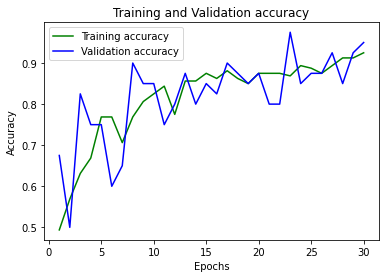

In [ ]:
accuracy_train = history.history['accuracy']
accuracy_val = history.history['val_accuracy']
epochstoplot = range(1, epochs+1)
plt.plot(epochstoplot, accuracy_train, 'g', label='Training accuracy')
plt.plot(epochstoplot, accuracy_val, 'b', label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# **Testing the CNN Model**

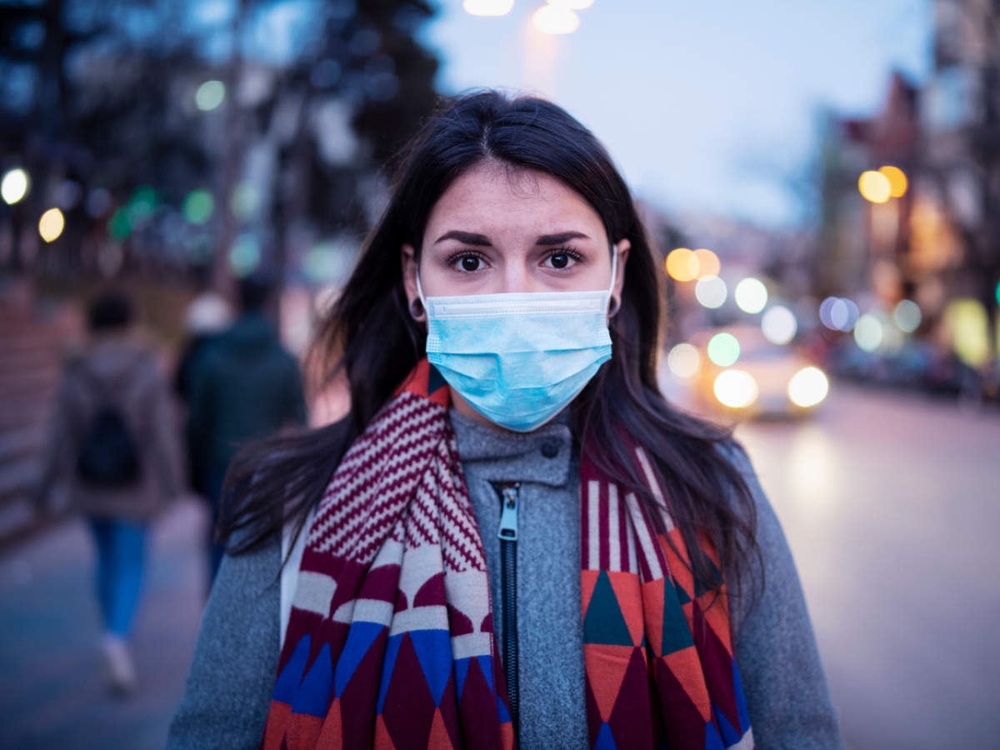

With Mask. 



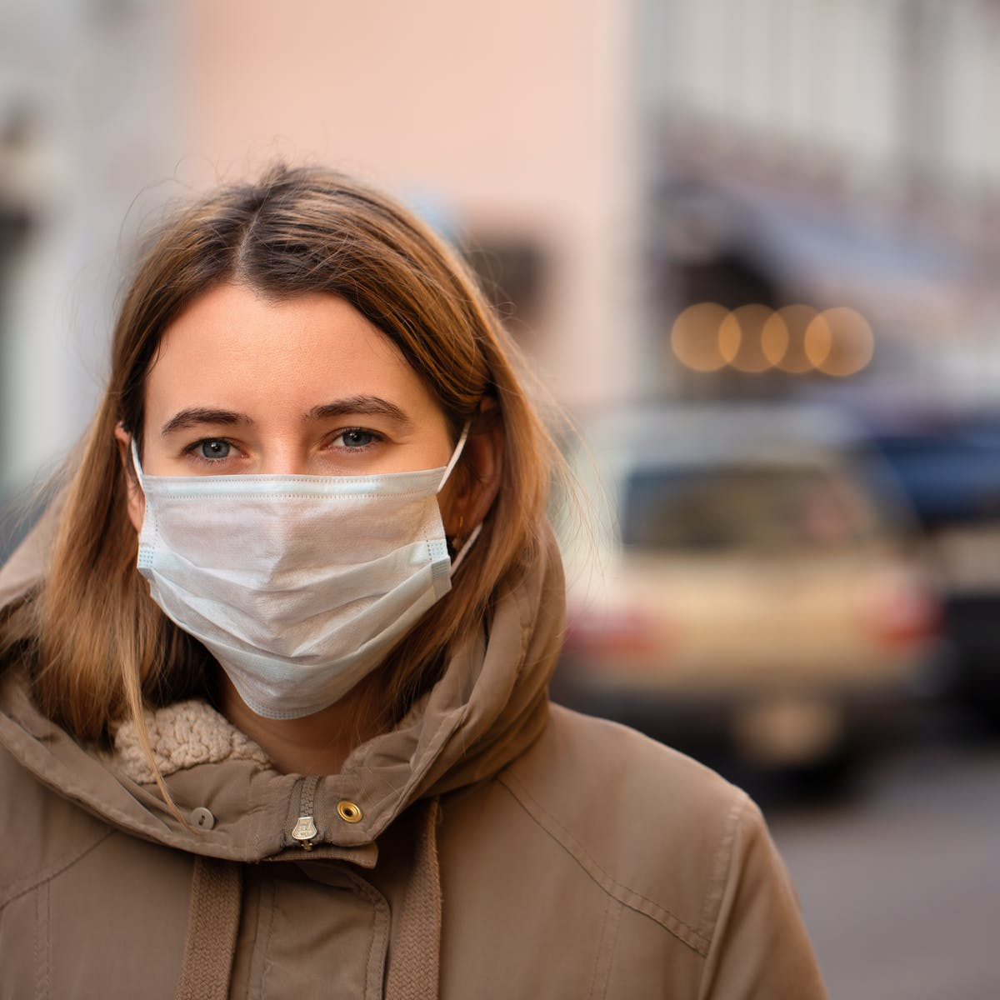

Without Mask. 



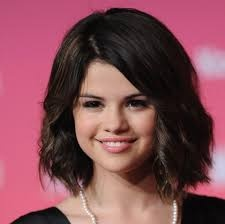

Without Mask. 



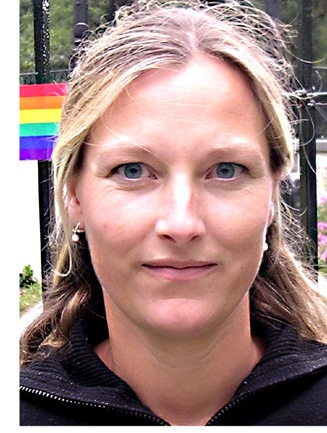

Without Mask. 



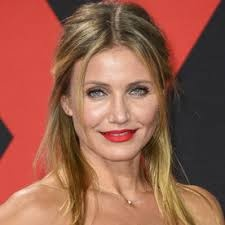

Without Mask. 



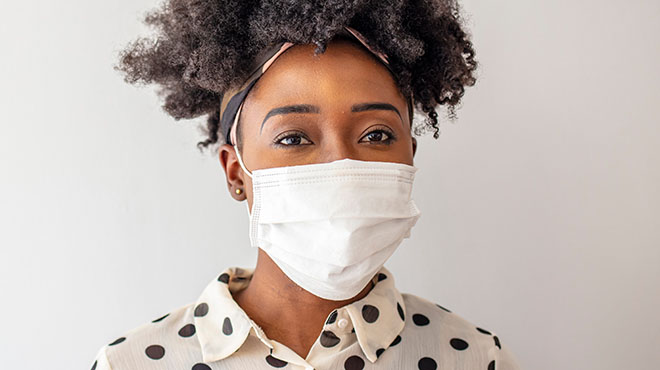

With Mask. 



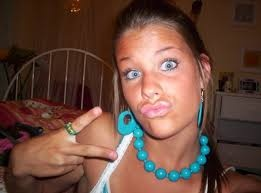

Without Mask. 



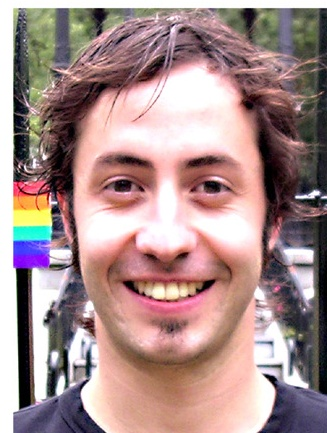

With Mask. 



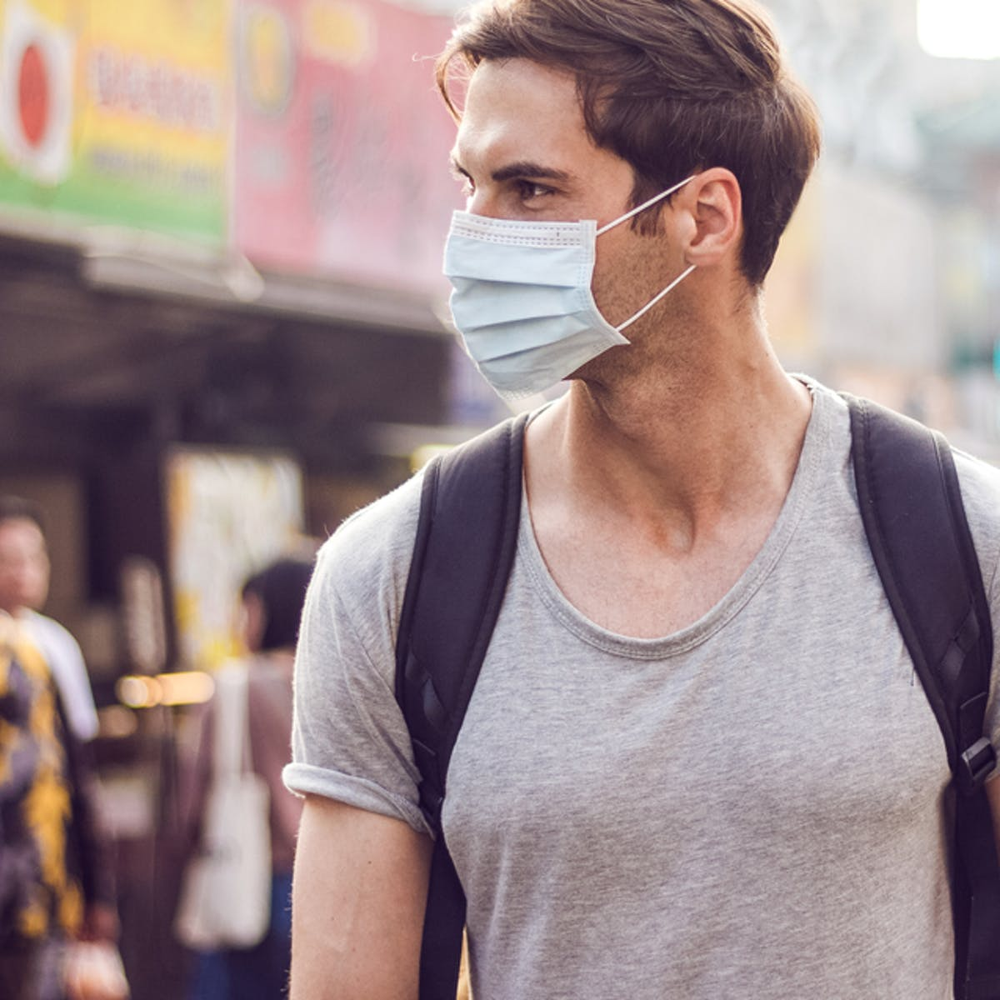

With Mask. 



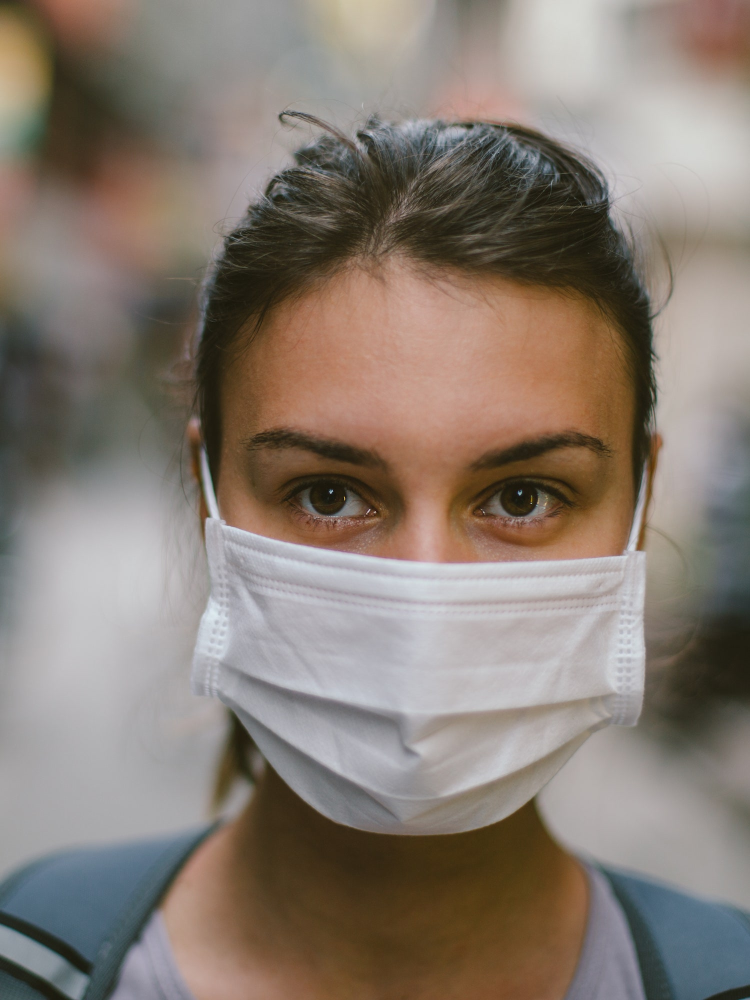

With Mask. 



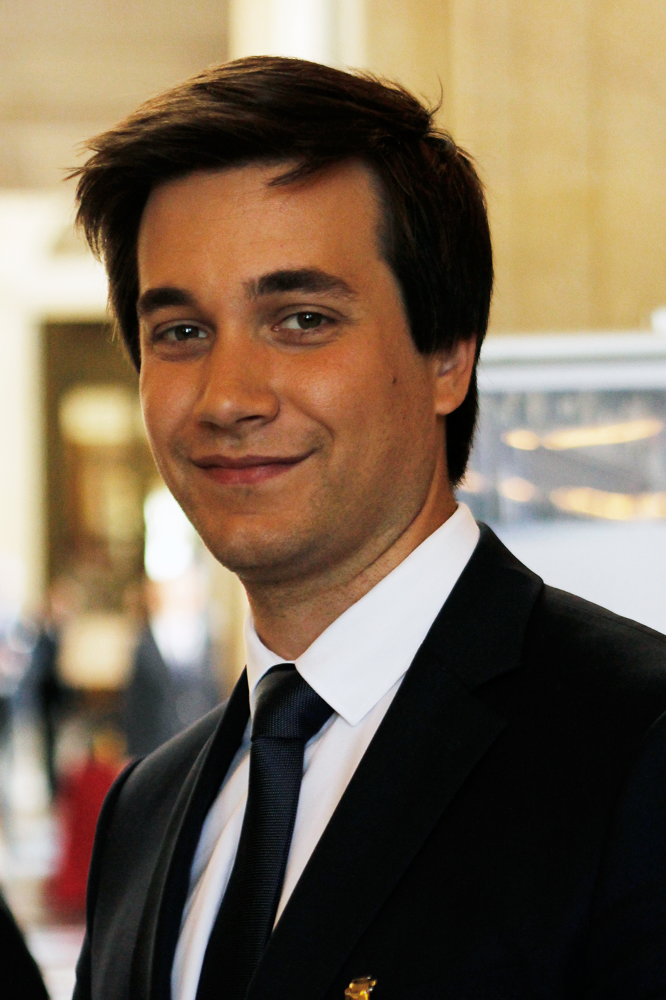

With Mask. 



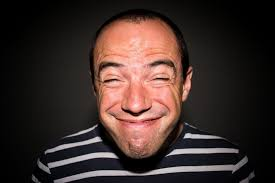

Without Mask. 



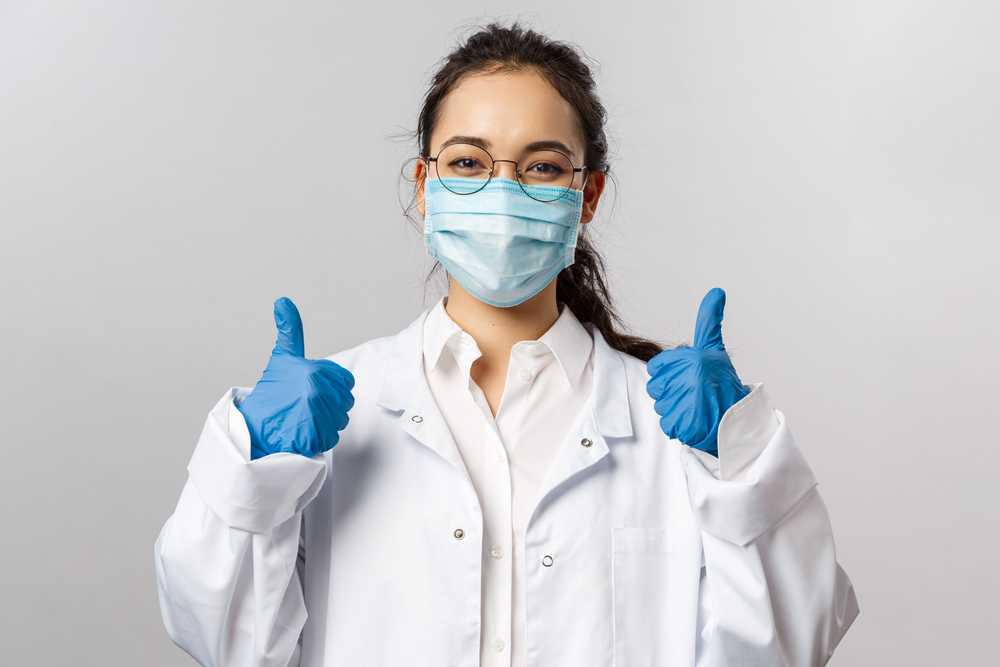

With Mask. 



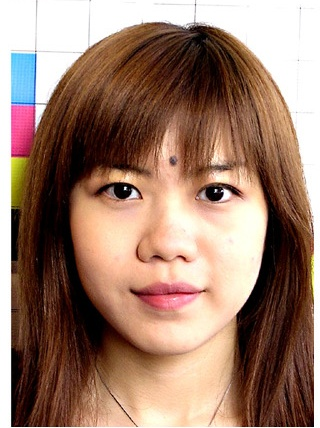

Without Mask. 



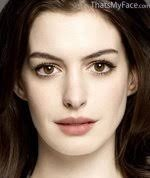

With Mask. 



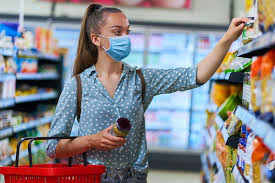

With Mask. 



In [ ]:
from IPython.display import Image, display
TYELLOW =   '\033[1;33m'
TRED =   '\033[1;31m'
import numpy as np

for i in range (1,17):
  img_directory = str(i) + '.jpg'
  img_data = image.load_img(img_directory, target_size= (70,70))
  img_data = image.img_to_array(img_data)
  img_data = np.expand_dims(img_data, axis=0)

  classify = model.predict(img_data)
  display(Image(img_directory, width=300, height=250))

  if(int(classify[0][0]) == 0):
    print(TYELLOW + "With Mask. \n")
  else:
    print(TRED + "Without Mask. \n")